In [1]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import glob

from moviepy.editor import VideoFileClip
from IPython.display import HTML

%matplotlib inline

In [2]:
# STEP ONE Create a funtion that does camera calibration

In [3]:
def calibratecamera(images, nx=9, ny=6): # nx = inside corners in x axis, vice versa
    # create object points, and reshape its transposed matrix
    objp = np.zeros((nx*ny,3), np.float32) 
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    objpoints = [] # for 3d points in real world 
    imgpoints = [] # for 2d points in image world
    
    for count, file in enumerate(testimages):
        image = mpimg.imread(file)
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        found, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        if found:
            objpoints.append(objp)
            imgpoints.append(corners)
            
            # Draw and visualize
            drawing = cv2.drawChessboardCorners(image, (9,6), corners, True)

    if len(objpoints)>0:
        print("Camera is calibrated!")
        print('=============================================================================================') 
        ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
    else:
        print("Unable to calibrate the camera.")
        print('=============================================================================================') 
        ret, mtx, dist, rvecs, tvecs = (None, None, None, None, None)
                    
    return ret, mtx, dist, rvecs, tvecs


In [4]:
# create a list of test images and calibrate camera using it
testimages = glob.glob('./camera_cal/calibration*.jpg')
ret, mtx, dist, rvecs, tvecs = calibratecamera(testimages)

Camera is calibrated!


In [5]:
# STEP TWO Distortion Correction

In [6]:
image = mpimg.imread( './camera_cal/calibration1.jpg')

# Calibration of camera based on 2D and 3D points found in previous drawings
ret, mtx, dist, rvecs, tvecs = calibratecamera(image)

# Since we are only interested in mtx and dist, 
print('===================================================================================')  
print('Matrix looks like this :-\n', mtx)
print('===================================================================================')  
print('Distortion Coefficient looks like this :-\n', dist)
print('===================================================================================')  

# Image Distortion Correction function
def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist    

Camera is calibrated!
Matrix looks like this :-
 [[1.15777818e+03 0.00000000e+00 6.67113857e+02]
 [0.00000000e+00 1.15282217e+03 3.86124583e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Distortion Coefficient looks like this :-
 [[-0.24688507 -0.02373156 -0.00109831  0.00035107 -0.00259866]]


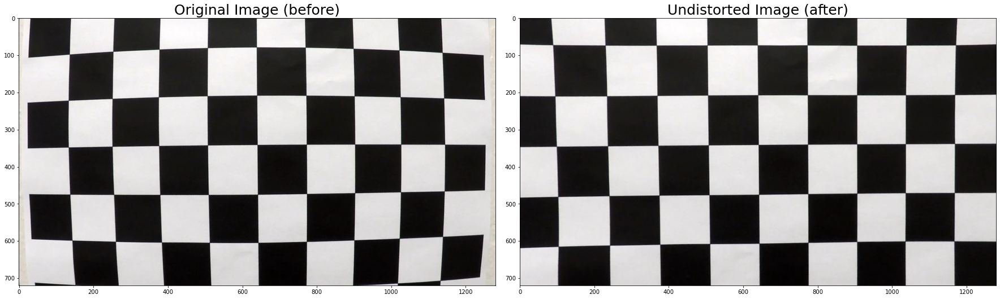

In [7]:
# Using the undistort function on a test image
fname = './camera_cal/calibration1.jpg'
img = mpimg.imread(fname)
testing = undistort(img, mtx, dist)

# Visualize result, before and after
figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image (before)', fontsize=25)
ax2.imshow(testing)
ax2.set_title('Undistorted Image (after)', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

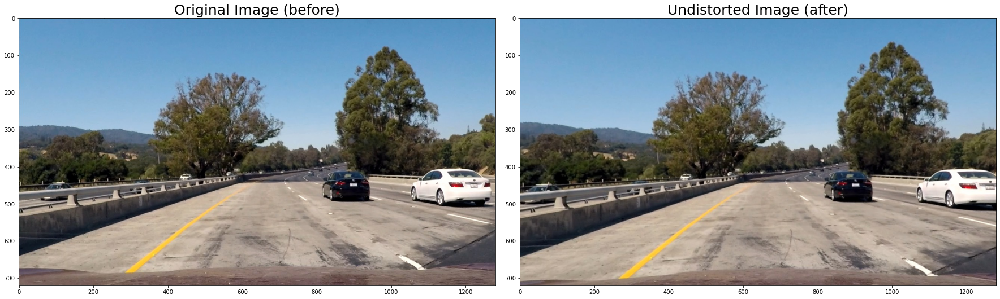

In [8]:
# Using the undistort function on a snapshot from a car video
fname = './test_images/test1.jpg'
img = mpimg.imread(fname)
testing = undistort(img, mtx, dist)

# Visualize result, before and after
figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image (before)', fontsize=25)

ax2.imshow(testing)
ax2.set_title('Undistorted Image (after)', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [9]:
# STEP THREE Color Transform

In [10]:
# Convert undistorted image to HLS color spaces and take out the S channel 
def colortransform(img, satthres=(170, 255), gradientthres=(20,100)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    satchannel = hls[:,:,2] # saturation channel
    
    # Sobel of x-axis direction using l channel 
    sobelx = cv2.Sobel(satchannel, cv2.CV_64F, 1, 0, 3) # calculate derivative in x direction
    absox = np.absolute(sobelx) # magnitude derivative to stand out from horizontal (y-axis)
    scaledsobelx = np.uint8(255*absox/np.max(absox)) # convert value image to 8-bit
    # Threshold sobel channel
    sobelxbinary = np.zeros_like(scaledsobelx)
    sobelxbinary[(scaledsobelx >= gradientthres[0]) & (scaledsobelx <= gradientthres[1])] = 1

    # Threshold saturation channel 
    satbinary = np.zeros_like(satchannel)
    satbinary[(satchannel >= satthres[0]) & (satchannel <= satthres[1])] = 1
    
    # COMBINE
    combined = np.zeros_like(satchannel)
    combined[(sobelxbinary == 1) | (satbinary == 1)] = 1
    
    return combined


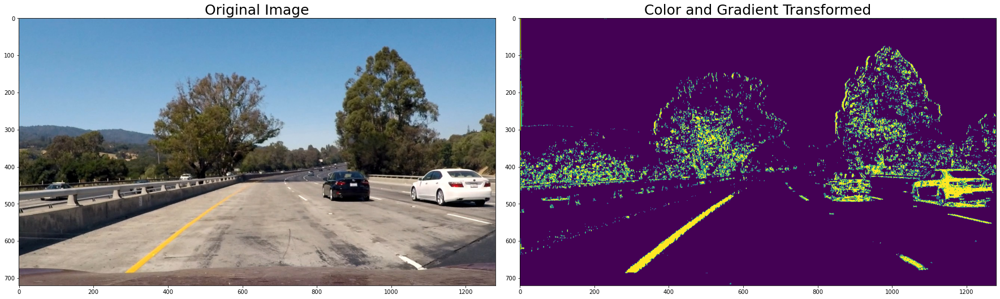

In [11]:
# Using color transform on a list of test images
fname = './test_images/test1.jpg'
original = mpimg.imread(fname)
colortransformed = colortransform(original)

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
figure.tight_layout()
ax1.imshow(original)
ax1.set_title('Original Image', fontsize=25)

ax2.imshow(colortransformed)
ax2.set_title('Color and Gradient Transformed', fontsize=25)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [12]:
# STEP FOUR Perspective Transform

In [13]:
# Create funtion to warp
def warp(img):
    height, width = img.shape[:2]

    # Dots for original image
    src = np.float32([
        [width//2-76, height*0.625],
        [width//2+76, height*0.625],
        [-100,        height],
        [width+100,   height]
    ])

    # Dots for destination image
    dst = np.float32([
        [100,       0],
        [width-100, 0],
        [100,       height],
        [width-100, height]
    ])
    imgsize = (img.shape[1], img.shape[0])
    Matrix = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, Matrix, imgsize, flags=cv2.INTER_NEAREST) # keep same size as input image
    return warped

def unwarp(img):
    height, width = img.shape[:2]

    # Dots for original image
    src = np.float32([
        [width//2-76, height*0.625],
        [width//2+76, height*0.625],
        [-100,        height],
        [width+100,   height]
    ])

    # Dots for destination image
    dst = np.float32([
        [100,       0],
        [width-100, 0],
        [100,       height],
        [width-100, height]
    ])
    
    imgsize = (img.shape[1], img.shape[0])
    InverseMatrix = cv2.getPerspectiveTransform(dst, src)
    unwarped = cv2.warpPerspective(img, InverseMatrix, imgsize, flags=cv2.INTER_NEAREST) 
    return unwarped    



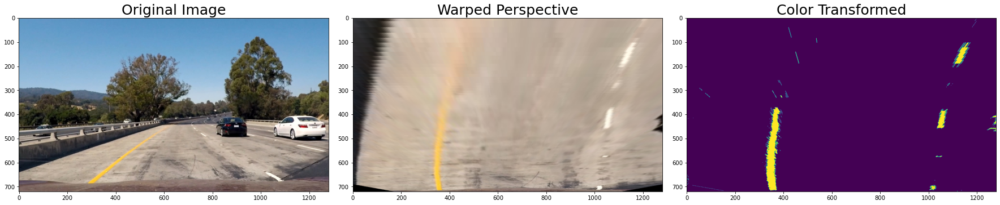

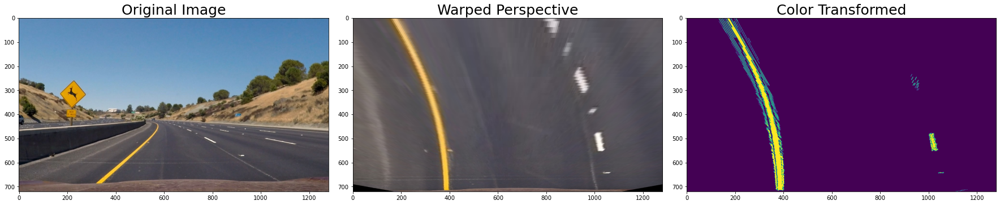

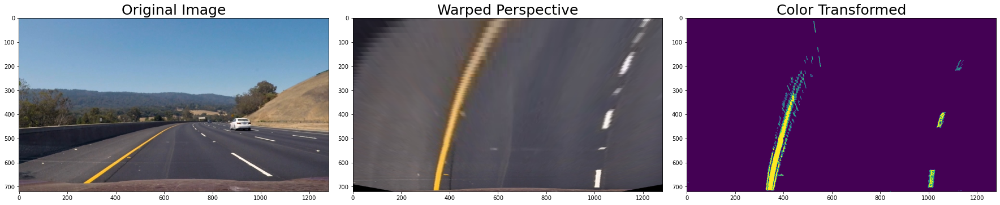

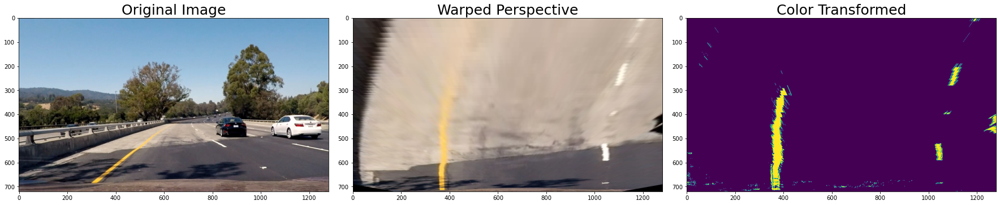

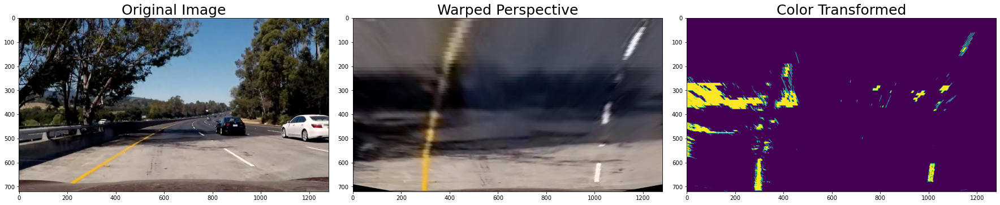

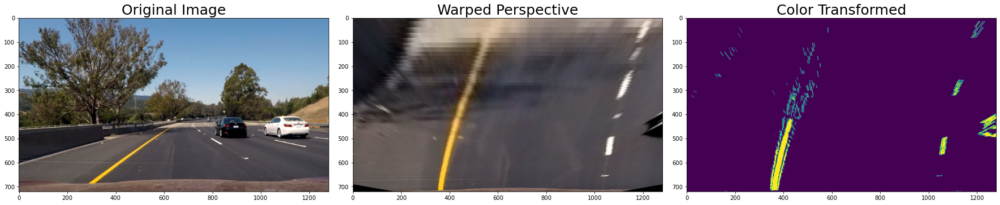

In [14]:
# Using warp function on test images
testlist = glob.glob('test_images/test*.jpg')

for img in testlist:
    img = mpimg.imread(img)    
    # Clean the image
    undist = undistort(img, mtx, dist)
    warpedimg = warp(undist)
    colortransformed = colortransform(warpedimg)
    
    # Visualize results
    figure, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    figure.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=25)

    ax2.imshow(warpedimg)
    ax2.set_title('Warped Perspective', fontsize=25)
    
    ax3.imshow(colortransformed)
    ax3.set_title('Color Transformed', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    


In [15]:
# STEP FIVE Find lane boundary

In [16]:
# Take histograms out of warped binary image from above to find left and right peaks

def findlane(binarywarped): # INPUT MUST BE 1 channel(warped-binary)
    histogram = np.sum(binarywarped[binarywarped.shape[0]//2:,:], axis=0) # histogram of bottom half of image
    output = np.dstack((binarywarped, binarywarped, binarywarped))
    # Find peak on left and right as starting point of windows creation
    midbottom = np.int(histogram.shape[0]//2)
    leftbottom =  np.argmax(histogram[:midbottom])
    rightbottom = np.argmax(histogram[midbottom:]) + midbottom
    
    # Window parameters
    winnum, winwidth, minpix = 8, 100, 50 # minpix to recenter windows
    winheight = np.int(binarywarped.shape[0]//winnum)
    
    # Find (x,y) of all nonzero(non-black) pixels 
    nonzero = binarywarped.nonzero()
    nonzerox, nonzeroy = nonzero[1], nonzero[0]
    
    # For update when windows going up
    newleft = leftbottom
    newright = rightbottom
    
    # Create list to store left and right indices
    leftlaneinds = []
    rightlaneinds = []
    
    # Go through each windows to draw box windows
    for win in range(winnum):
        
        # Set (x,y) boundaries for left and right windows
        ylow = binarywarped.shape[0] - (win + 1)*winheight
        yhigh = binarywarped.shape[0] - win*winheight
        xleftlow = newleft - winwidth
        xlefthigh = newleft + winwidth
        xrightlow = newright - winwidth
        xrighthigh = newright + winwidth
        
        # Draw windows
        cv2.rectangle(output, (xleftlow, ylow), (xlefthigh, yhigh), (0,255,0), 2)
        cv2.rectangle(output, (xrightlow, ylow), (xrighthigh, yhigh), (0,255,0), 2)

        # Find nonzeros(nonblack) pixels in windows
        goodleft = ((nonzeroy > ylow) & (nonzeroy < yhigh) & (nonzerox > xleftlow) & (nonzerox < xlefthigh)).nonzero()[0]
        goodright = ((nonzeroy > ylow) & (nonzeroy < yhigh) & (nonzerox > xrightlow) & (nonzerox < xrighthigh)).nonzero()[0]
        
        # Append indices to lists
        leftlaneinds.append(goodleft)
        rightlaneinds.append(goodright)
    
        # Recenter windows if not centered
        if len(goodleft) > minpix:
            newleft = np.int(np.mean(nonzerox[goodleft]))
        if len(goodright) > minpix:
            newright = np.int(np.mean(nonzerox[goodright]))
        
    # Time to concatenate windows from the established lists
    try:
        leftlaneinds = np.concatenate(leftlaneinds)
        rightlaneinds = np.concatenate(rightlaneinds)
    except ValueError:
        pass # Avoids error if above not implemented fully
        
    # Extract final pixels in windows
    leftx = nonzerox[leftlaneinds]
    lefty = nonzeroy[leftlaneinds]
    rightx = nonzerox[rightlaneinds]
    righty = nonzeroy[rightlaneinds]
    
    # Make a polynomial to each side
    leftfit = np.polyfit(lefty, leftx, 2)
    rightfit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binarywarped.shape[0]-1, binarywarped.shape[0])
    leftfitx = leftfit[0]*ploty**2 + leftfit[1]*ploty + leftfit[2]
    rightfitx = rightfit[0]*ploty**2 + rightfit[1]*ploty + rightfit[2]
    
    # Visualize plot
    output[lefty, leftx] = [255,0,0]
    output[righty, rightx] = [0,255,0]    
    
    for i in range(binarywarped.shape[0]):
        cv2.circle(output, (int(leftfitx[i]), int(ploty[i])), 3, (255,255,0) )
        cv2.circle(output, (int(rightfitx[i]), int(ploty[i])), 3, (255,255,0) )

    return output, leftx, lefty, rightx, righty

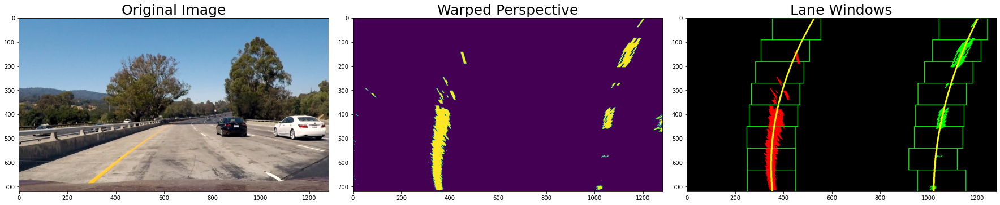

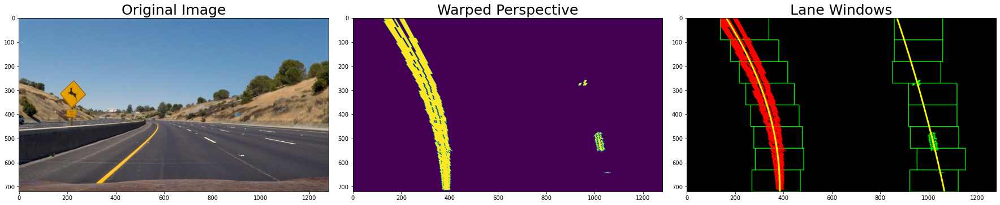

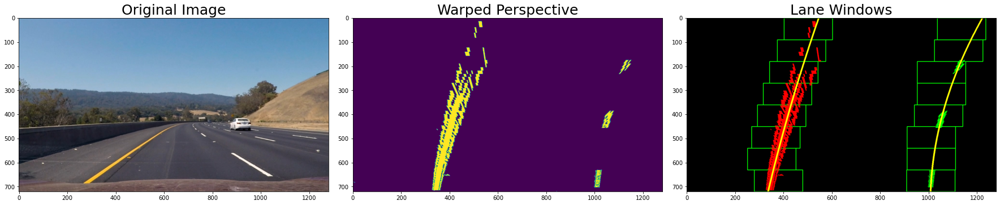

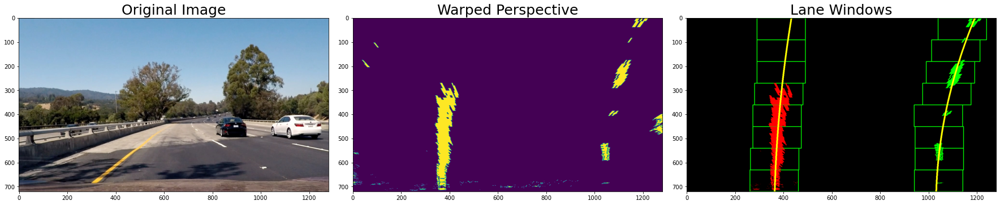

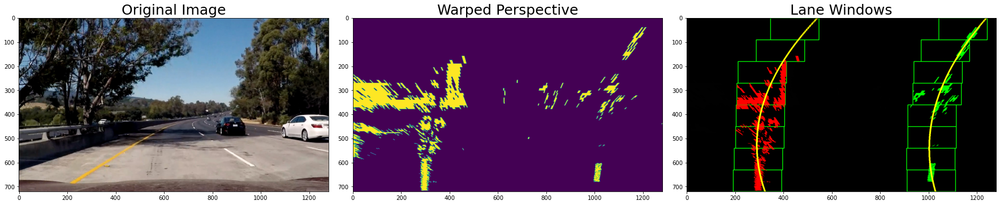

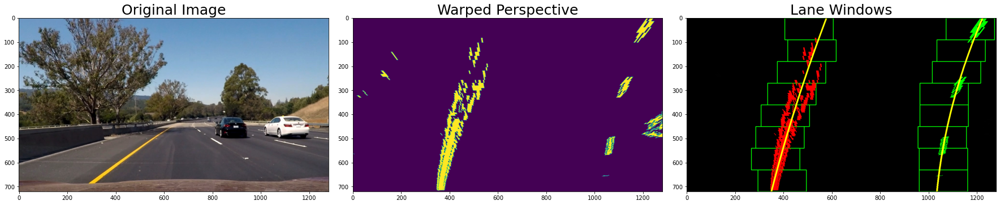

In [17]:
# Using find lane pixel function on test images
testlist = glob.glob('./test_images/test*.jpg')

for img in testlist:
    img = mpimg.imread(img)    
    
    undist = undistort(img, mtx, dist)
    colortransformed = colortransform(undist)
    warpedimg = warp(colortransformed)
    output, leftx, lefty, rightx, righty = findlane(warpedimg)
    
    # Visualize results
    figure, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    figure.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=25)

    ax2.imshow(warpedimg)
    ax2.set_title('Warped Perspective', fontsize=25)
    
    ax3.imshow(output)
    ax3.set_title('Lane Windows', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [18]:
# Make another function to generate sliding window rather that starting fresh in each frame
def slidingpoly(binarywarped):
    # Slider parameter
    winwidth = 100
    
    # Find nonzero (non-black) pixels
    nonzero = binarywarped.nonzero()
    nonzerox, nonzeroy = nonzero[1], nonzero[0]
    
    # Take input from previous function
    output, leftx, lefty, rightx, righty = findlane(binarywarped)
    
    # Fit a second order polynomial to each side
    leftfit = np.polyfit(lefty, leftx, 2)
    rightfit = np.polyfit(righty, rightx, 2)
    
    leftlaneinds = ((nonzerox > (leftfit[0]*(nonzeroy**2) + leftfit[1]*(nonzeroy) 
                     + leftfit[2] - winwidth)) & (nonzerox < (leftfit[0]*(nonzeroy**2) 
                     + leftfit[1]*(nonzeroy) + leftfit[2] + winwidth)))
                                              
    rightlaneinds = ((nonzerox > (rightfit[0]*(nonzeroy**2) + rightfit[1]*(nonzeroy) 
                     + rightfit[2] - winwidth)) & (nonzerox < (rightfit[0]*(nonzeroy**2) 
                     + rightfit[1]*(nonzeroy) + rightfit[2] + winwidth)))
    
    # Extract left and right pixels
    leftx = nonzerox[leftlaneinds]
    lefty = nonzeroy[leftlaneinds]
    rightx = nonzerox[rightlaneinds]
    righty = nonzeroy[rightlaneinds]
    
    # Generate coordinate for plotting
    ploty = np.linspace(0, output.shape[0]-1, output.shape[0])
    leftfitx = leftfit[0]*ploty**2 + leftfit[1]*ploty + leftfit[2]
    rightfitx = rightfit[0]*ploty**2 + rightfit[1]*ploty + rightfit[2]
    
    # Create image to draw on and another to show the selection windows
    output = np.dstack((binarywarped,binarywarped,binarywarped))*255
    windowslide = np.zeros_like(output)
    
    
    # Generate polygon to show search window area and execute x,y to fit format in cv2.fillPoly()
    leftwindow1 = np.array([np.transpose(np.vstack([leftfitx - winwidth, ploty]))])
    leftwindow2 = np.array([np.flipud(np.transpose(np.vstack([leftfitx + winwidth, ploty])))])                  
    leftlinepoints = np.hstack((leftwindow1, leftwindow2))
                       
    rightwindow1 = np.array([np.transpose(np.vstack([rightfitx - winwidth, ploty]))])
    rightwindow2= np.array([np.flipud(np.transpose(np.vstack([rightfitx + winwidth, ploty])))])                
    rightlinepoints = np.hstack((rightwindow1, rightwindow2))     
    
    # Draw lanes onto warped binary image
    cv2.fillPoly(windowslide, np.int_([leftlinepoints]), (0,100,0))
    cv2.fillPoly(windowslide, np.int_([rightlinepoints]), (0,100,0))    
    output = cv2.addWeighted(windowslide, 1, windowslide, 0.3, 0)   
    
    # Give color
    output[nonzeroy[leftlaneinds], nonzerox[leftlaneinds]] = [255,0,0]
    output[nonzeroy[rightlaneinds], nonzerox[rightlaneinds]] = [0,0,255]
                       
    for i in range(binarywarped.shape[0]):
        cv2.circle(output, (int(leftfitx[i]), int(ploty[i])), 3, (255,255,0) )
        cv2.circle(output, (int(rightfitx[i]), int(ploty[i])), 3, (255,255,0) )

    return output, leftx, lefty, rightx, righty, leftfitx, rightfitx
    

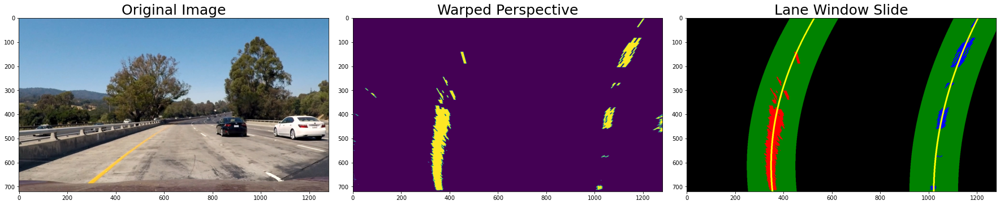

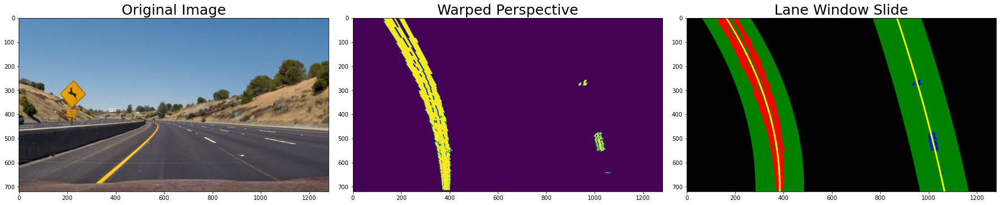

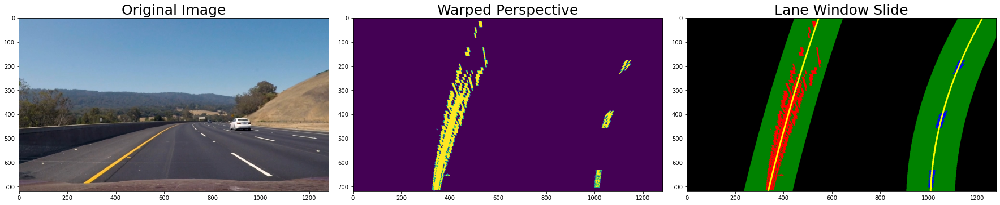

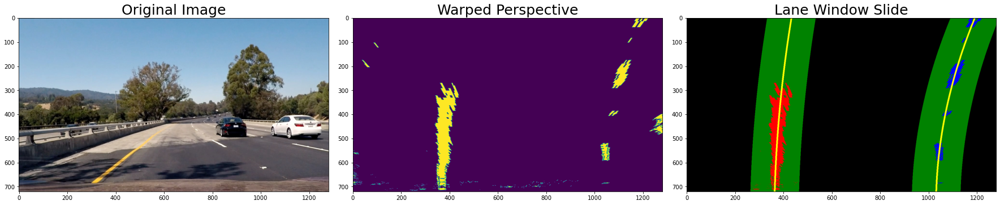

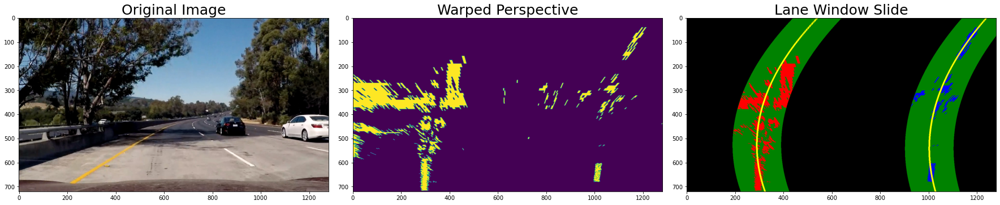

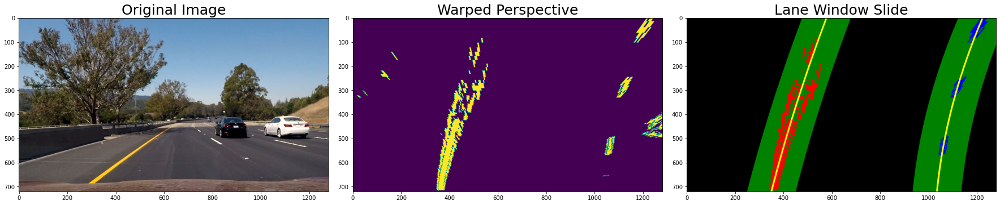

In [19]:
# Using slidingpoly function on test images
testlist = glob.glob('./test_images/test*.jpg')

for img in testlist:
    img = mpimg.imread(img)    
    
    undist = undistort(img, mtx, dist)
    colortransformed = colortransform(undist)
    warpedimg = warp(colortransformed)
    output, leftx, lefty, rightx, righty, leftfitx, rightfitx = slidingpoly(warpedimg)
    
    # Visualize results
    figure, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    figure.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=25)

    ax2.imshow(warpedimg)
    ax2.set_title('Warped Perspective', fontsize=25)
    
    ax3.imshow(output)
    ax3.set_title('Lane Window Slide', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [20]:
# STEP SIX Calculate curvature

In [21]:
# Creating a function to calculate lane curvature and vehicle position with relative to lane center

def drawtext(leftx, rightx, output):
    finaloutput = np.copy(output)
    
    # Generate coordinate
    ploty = np.linspace(0, output.shape[0] - 1, output.shape[0])

    # MUST define conversion in x and y from pixel to real world METERS
    ymperpixel = 30/720 # lane is about 30m long in the projection video
    xmperpixel = 3.7/800 # lane width is 3.7m wide, 720 is pixels in y axis

    # Create new polynomials to x and y in world space
    leftcurve = np.polyfit(ploty*ymperpixel, leftx*xmperpixel, 2)
    rightcurve = np.polyfit(ploty*ymperpixel, rightx*xmperpixel, 2)
    
    # Calculate radius of curvature
    
    leftradius = ((1 + (2*leftcurve[0]*np.max(ploty)*ymperpixel + leftcurve[1])**2)**1.5)/np.absolute(2*leftcurve[0])
    rightradius = ((1 + (2*rightcurve[0]*np.max(ploty)*ymperpixel + rightcurve[1])**2)**1.5)/np.absolute(2*rightcurve[0])
    
    # Average radius
    radius = np.average([leftradius, rightradius])
    
    # From center
    midimage = output.shape[1]//2
    
    # Car position with respect to camera center
    carposition = (leftx[-1] + rightx[-1]/2)
    
    # Car offset
    center = (midimage-carposition)*xmperpixel
       
    cv2.putText(finaloutput, 'Radius of curvature: {:.2f} m'.format(radius),
               (60,60), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,0), 5)
    cv2.putText(finaloutput, 'Car distance from center : {:.2f} m'.format(center),
               (60,120), cv2.FONT_HERSHEY_DUPLEX, 1.5, (255,255,0), 5)
    
    return finaloutput
    

In [22]:
# STEP SEVEN Unwarp and draw entire lane boundaries

In [23]:
def drawboundary(image, binarywarped, leftfitx, rightfitx):
    # Create image to draw on
    warpzero = np.zeros_like(binarywarped)
    colorwarp = np.dstack((warpzero,warpzero,warpzero))
    ploty = np.linspace(0, image.shape[0] - 1, image.shape[0])
     
    leftboundary = np.array([np.transpose(np.vstack([leftfitx, ploty]))])
    rightboundary = np.array([np.flipud(np.transpose(np.vstack([rightfitx, ploty])))])
    boundary = np.hstack((leftboundary, rightboundary))
    
    # Draw boundaries onto zero image
    cv2.fillPoly(colorwarp, np.int_([boundary]), (0,255,0))
    
    # Warp to original image
    newwarp = unwarp(colorwarp)
    
    return cv2.addWeighted(image, 1, newwarp, 0.3, 0)

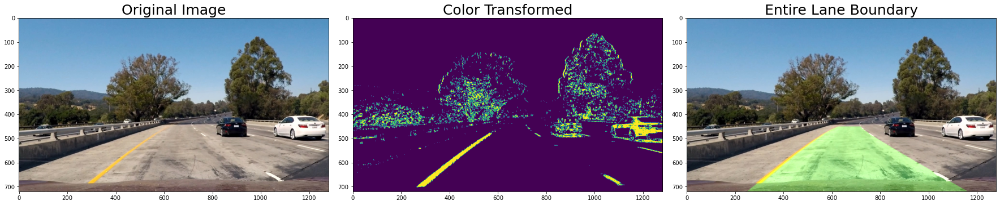

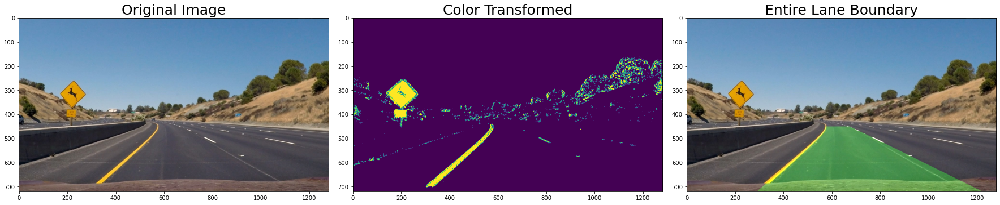

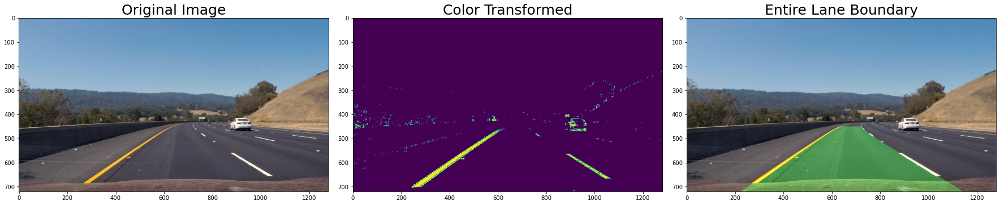

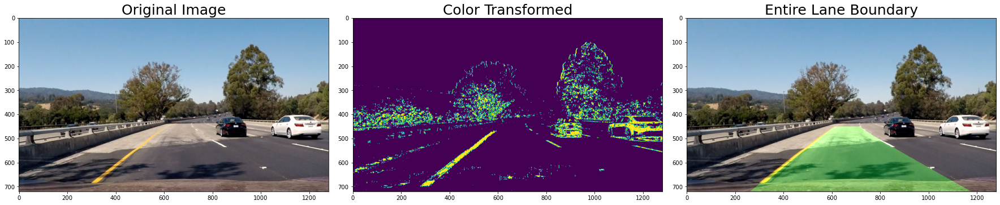

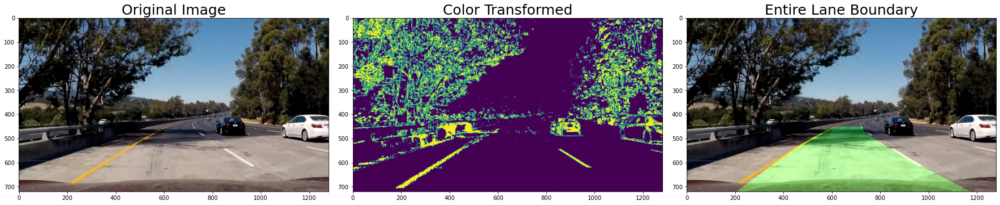

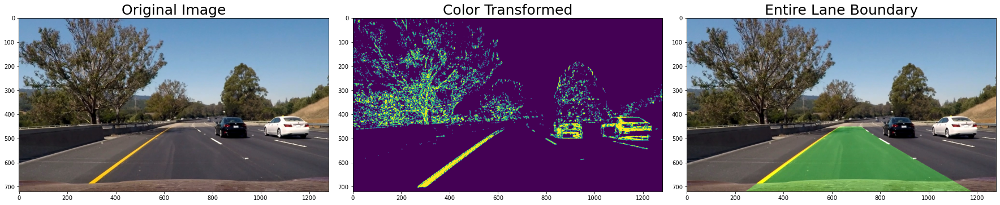

In [24]:
# Using drawboundary funtion on test images

testlist = glob.glob('./test_images/test*.jpg')

for img in testlist:
    img = mpimg.imread(img)    
    
    undist = undistort(img, mtx, dist)
    colortransformed = colortransform(undist)
    warpedimg = warp(colortransformed)
    output, leftx, lefty, rightx, righty, leftfitx, rightfitx = slidingpoly(warpedimg)
    makeboundary = drawboundary(img, warpedimg, leftfitx, rightfitx)

    
    
    # Visualize results
    figure, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    figure.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=25)

    ax2.imshow(colortransformed)
    ax2.set_title('Color Transformed', fontsize=25)
    
    ax3.imshow(makeboundary)
    ax3.set_title('Entire Lane Boundary', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [25]:
# STEP EIGHT Insert curvature and vehicle position value onto entire lane boundary image

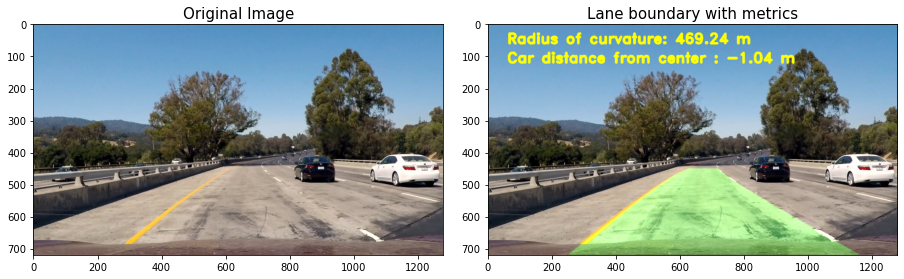

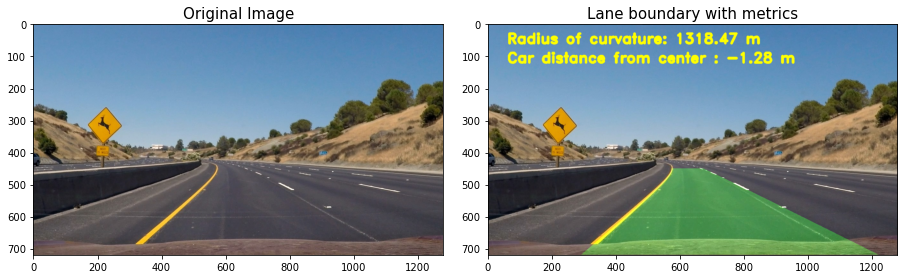

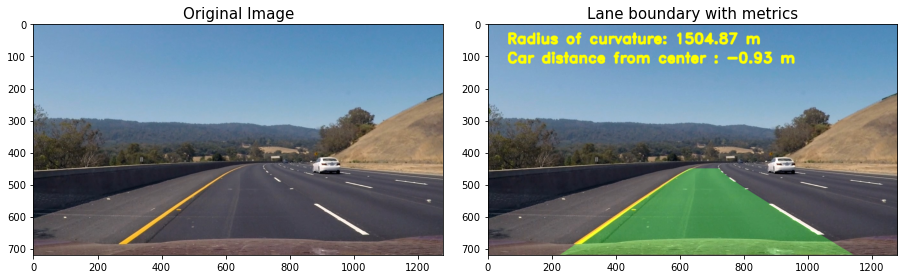

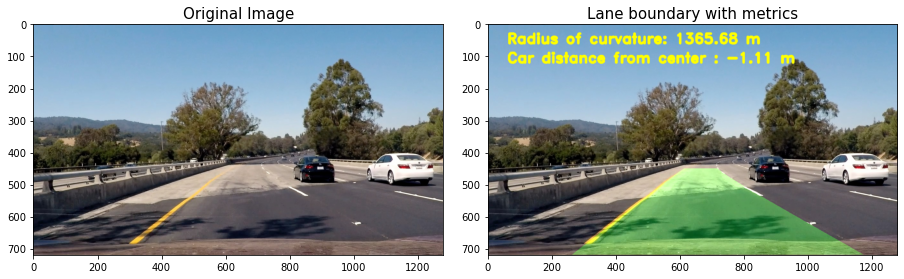

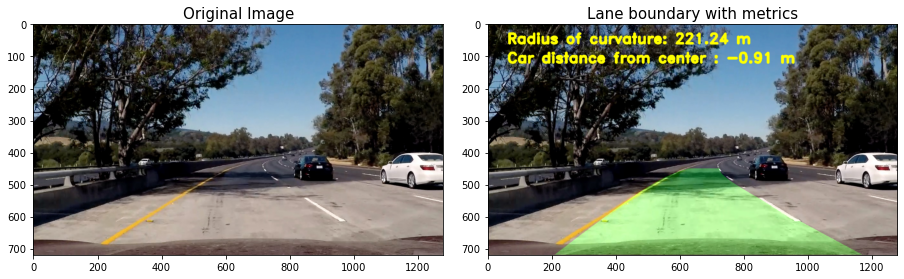

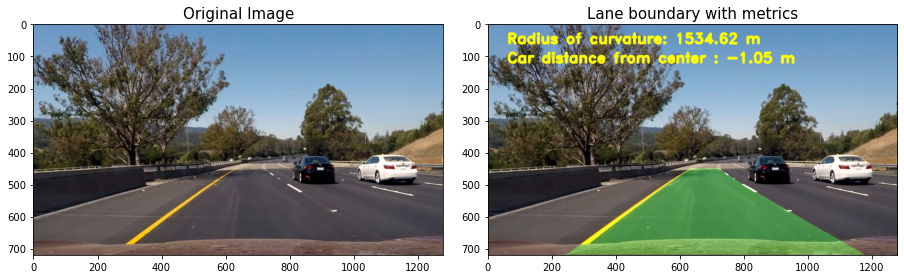

In [26]:
testlist = glob.glob('./test_images/test*.jpg')

for image in testlist:
    img = mpimg.imread(image)    
    
    undist = undistort(img, mtx, dist)
    colortransformed = colortransform(undist)
    warpedimg = warp(colortransformed)
    output, leftx, lefty, rightx, righty, leftfitx, rightfitx = slidingpoly(warpedimg)
    makeboundary = drawboundary(img, warpedimg, leftfitx, rightfitx)
    finaloutput = drawtext(leftfitx, rightfitx, makeboundary)
    
    mpimg.imsave(image.replace('test_images', 'output_images') ,finaloutput)
    
    # Visualize results
    figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    figure.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=15)

    ax2.imshow(finaloutput)
    ax2.set_title('Lane boundary with metrics', fontsize=15)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


In [27]:
# STEP NINE Test pipeline with a video

In [28]:
class ProcessVideo:
    def __init__(self, images):
        images = glob.glob(images) # Create a list of images 
        
        # Calibrate camera
        self.ret, self.mtx, self.dist, self.rvecs, self.tvecs = calibratecamera(images)
        
    def __call__(self, img):

        undist = undistort(img, self.mtx, self.dist)
        colortransformed = colortransform(undist)
        warpedimg = warp(colortransformed)
        output, leftx, lefty, rightx, righty, leftfitx, rightfitx = slidingpoly(warpedimg)
        makeboundary = drawboundary(img, warpedimg, leftfitx, rightfitx)
        finaloutput = drawtext(leftfitx, rightfitx, makeboundary)
        
        return finaloutput         

In [29]:
def buildvideo(pathprefix):
    outputname = 'videos/{}_result.mp4'.format(pathprefix)
    inputname = VideoFileClip('videos/{}.mp4'.format(pathprefix))
    
    processresult = ProcessVideo('./camera_cal/calibration*.jpg')
    white_clip = inputname.fl_image(processresult)
    
    %time white_clip.write_videofile(outputname, audio=False)

In [35]:
buildvideo('project_video')

Camera is calibrated!


t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video videos/project_video_result.mp4.
Moviepy - Writing video videos/project_video_result.mp4



Moviepy - Done !
Moviepy - video ready videos/project_video_result.mp4
Wall time: 3min 21s


In [31]:
def creategif(pathprefix, s=(0,0), f=(0,15)):
    videofile = 'videos/{}_result.mp4'.format(pathprefix)
    clip = (VideoFileClip(videofile).subclip(s,f).resize(0.5))
    %time clip.write_gif('videos/{}_gifresult.gif'.format(pathprefix), fps=10)

In [32]:
creategif('project_video', s=(0,30), f=(0,40))

t:   2%|▏         | 2/100 [00:00<00:05, 18.06it/s, now=None]

MoviePy - Building file videos/project_video_gifresult.gif with imageio.


Wall time: 10.4 s
